<a href="https://colab.research.google.com/github/saimani5/VAE-tutorials/blob/main/ssrVAE_graphene.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*   This notebook takes you through the application of rotationally invariant semi-supervised variational autoencoder (ssrVAE) on STEM image of silicon in graphene manipulated by e-beam activation.  
*   The dataset consists of 50 different STEM images of silicon in graphene.
*   The dataset is initially passed through semantic segmentation DCNN network which classifies each pixel in an image into 3 different classes (C-atom, Si-atom, and background)
*   Since ssrVAE requires knowing at least the ground-truth targets of the supervised dataset apriori, we divide the sub-images (inputs) into 7 different classes based on the type and number of graphene rings present in the sub-image.
*   We understand that the labeling process used comes with its incompetencies, but it is a quick, autonomous way of labeling the graphene images.
*   Only 20% of the dataset is labeled, out of which 5% is set aside for validation purposes

*   semi-supervised autoencoder learns the patterns from the supervised dataset and applies it to the unsupervised dataset.
*   It not only predicts the classes of the supervised dataset, but also encodes them in the latent space condistioned on the predicted class.
*   This combination makes the ss-rVAE an exciting option to predict the class label of the unsupervised which is generated using a different distributions to that of the supervised dataset.
*   So, we form m independent latent spaces for a given dataset, where m is the number of classes present in the dataset.
*   On top of this ssrVAE (from pyroved) can also be used to condition the encodings on a continuous ground truth property associated with each data point. This is not discussed in this notebook.
*   rVAE comprises of an additional latent dimension to the regular VAE, which explicitly captures the rotations involved in the image.
*   This angular latent dimension is unsupervisedly learned while trying to reconstuct the original image.
*   Like in VAE, this latent dimension is also regularized using a prior.  

The ssrVAEs are defined and trained using a package called Pyroved (https://github.com/ziatdinovmax/pyroVED) which is built on top of Pyro probabilistic programming framework. Please feel free to write to valletisai.mani@gmail.com for further enquiries.

In [ ]:
# Download the dataset, Will explain what each file corresponds to later
!gdown https://drive.google.com/uc?id=1-JZSRjIjNjkR0ZQ8ffRDAZ2FID53Yhon
!gdown https://drive.google.com/uc?id=1-84vLdGFsimD1jaTcGcMzNRCSvjId7-Y
!gdown https://drive.google.com/uc?id=1-Lowglj7fwEFaJoC9EBKDyfCIsMgOnyu

Downloading...
From: https://drive.google.com/uc?id=1-JZSRjIjNjkR0ZQ8ffRDAZ2FID53Yhon
To: /content/3DStack13-1-dec.npy
100% 157M/157M [00:02<00:00, 67.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-84vLdGFsimD1jaTcGcMzNRCSvjId7-Y
To: /content/3DStack13-1-exp.npy
100% 52.4M/52.4M [00:00<00:00, 55.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-Lowglj7fwEFaJoC9EBKDyfCIsMgOnyu
To: /content/3DStack13-1-coord.npy
100% 2.45M/2.45M [00:00<00:00, 110MB/s]


In [ ]:
# Installing Kornia, pyroved and atomai
!pip install -q kornia git+https://github.com/saimani5/atomai@master git+https://github.com/ziatdinovmax/pyroVED@main

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.0/612.0 KB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 KB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.1/503.1 KB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 730.7/730.7 KB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.8/865.8 KB 11.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.10.1 requires matplotlib>=3.5.0, but you have matplotlib 3.3.4 which is incompatible.
mizani 0.8.1 requires matplotlib>=3.5.0, but you have matplotlib 3.3.4 which is incompatible.


In [ ]:
# Importing necessary packages
import torch
import numpy as np
import matplotlib.pyplot as plt


import pyroved as pv
import kornia as K
from torchvision import datasets

# We will use atomai just to create the dataset (sub-images)
import atomai as aoi
import cv2
from torchvision.utils import make_grid
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from scipy import stats
tt = torch.tensor
import networkx as nx
import seaborn as sns

In [ ]:
# Loading the downloaded dataset
STEM_real = np.load('3DStack13-1-exp.npy')   # raw STEM Image
decoded_imgs = np.load('3DStack13-1-dec.npy')   # oytput of DCNN where the each pixel is classified as one of the three classes (C, Si, or background)
lattice_coord = np.load('3DStack13-1-coord.npy', allow_pickle=True)[()]  # The atomic coodinates found by DCNN

In [ ]:
map_dict = {
    0: "C",
    1: "Si", #  we have only one class (single-channel rVAE), but this is just an example
}

To implement ssrVAE on a dataset, we should have the ground truth classes of each data point in the supervised dataset apriori. So, we are going to divide the dataset into classes based on the number and type of graphene rings present in the dataset in the next 2 sections.

# An example for how we are going to get the rings in a given image, which we will later use for labeling subimages

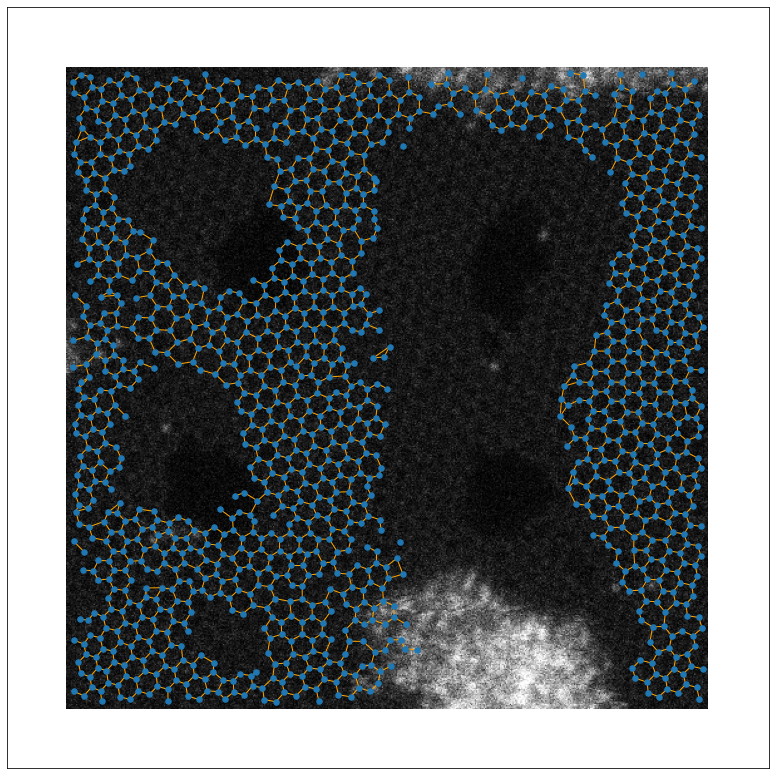

In [ ]:
coord = lattice_coord[49]  # Lattice coordinates of one frame
g = aoi.utils.Graph(coord, map_dict=map_dict)  # initializing a graph of atoms
g.find_neighbors(expand = 8.5, max_neighbors = 3)   # Forming the edges based on a distance threshold
aoi.utils.plot_graph(g, STEM_real[1,...,0], fsize = 14)   # Visualizing the formed graph

g.polycount(max_depth=7)   # getting the number of cycles/rings from the graph
g.remove_filled_polygons()

In [ ]:
# Now for each frame, we create a dummy channel
# For each of [5,6,7] membered rings detected, the ring's center pixel is populated using the number of nodes in this ring
cycles = []
ring_img = np.zeros_like(decoded_imgs[49,:,:,0])  # Dummy channel
for ring in g.rings:
    if len(ring) in [5,6,7]:
        c1, c2 = 0, 0
        for ver in ring:
            c1 += ver.pos[0]
            c2 += ver.pos[1]
        ring_img[int(c1/len(ring)), int(c2/len(ring))] = len(ring)   # populating the dummy channel
        cycles.append([int(c1/len(ring)), int(c2/len(ring)), len(ring)])

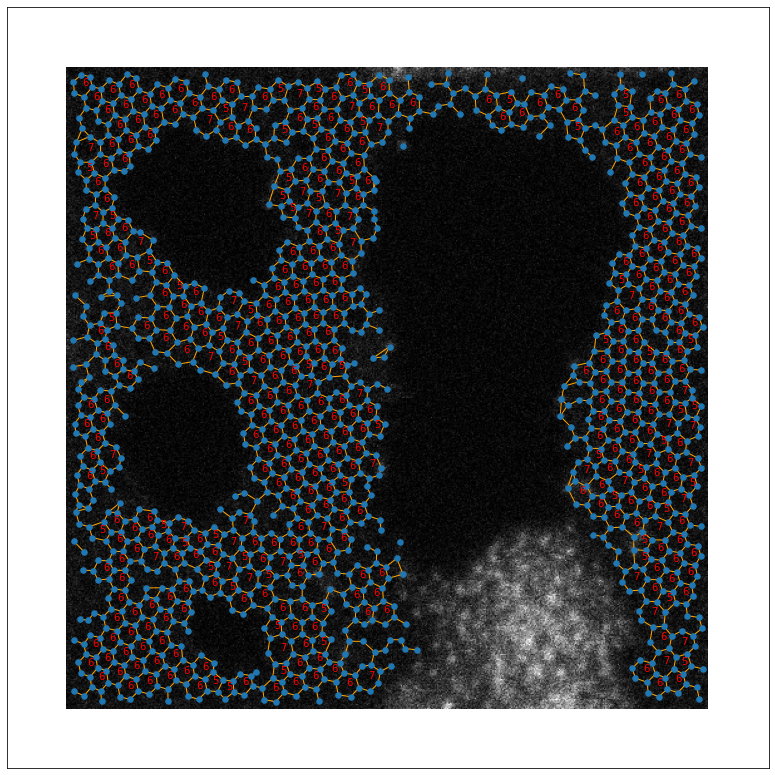

In [ ]:
# visulaizing the STEM images with the rings detected
fsize = (14,14)
_, ax = plt.subplots(1, 1, figsize=fsize)

G = g.nx_graph()
for k, v in nx.get_node_attributes(G, 'pos').items():
    G.nodes[k]['pos'] = v[::-1]
pos = nx.get_node_attributes(G, 'pos')

ax.imshow(STEM_real[49, :, :, 0], origin="lower", cmap="gray")
nx.draw_networkx_nodes(
    G, pos=pos, nodelist=G.nodes(), ax=ax,
    node_size=30,
    node_color="#1f78b4",
    alpha=None)
nx.draw_networkx_edges(
    G, pos, width=1, ax=ax,
    edge_color="orange",
    alpha= None)

for cyc in cycles:
    ax.annotate(cyc[2], (cyc[1], cyc[0]), fontsize=10, c = 'r')

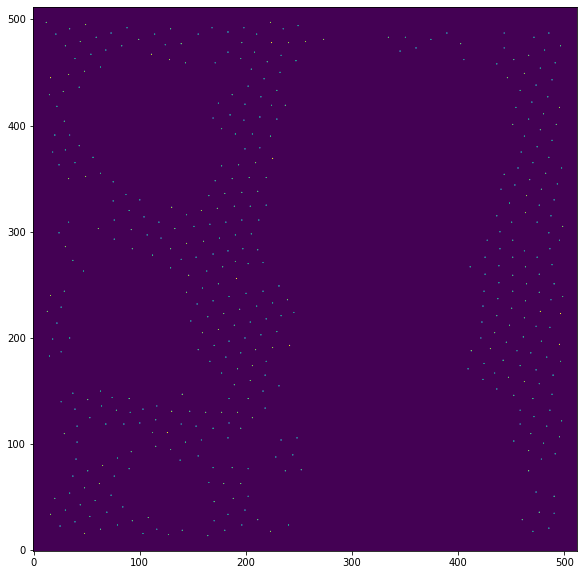

In [ ]:
# Visulaizing the dummy channel that was discussed above
plt.figure(figsize = (10,10))
plt.imshow(ring_img, origin = 'lower')
# plt.imshow(STEM_real)

# Getting the rings from all the frames and preparing the training dataset
Here, we repeat the proecess for all the frames in the dataset

In [ ]:
ring_imgs = np.zeros_like(STEM_real)
all_cycles = []
for i in range(len(lattice_coord)):
    coord = lattice_coord[i]
    g = aoi.utils.Graph(coord, map_dict=map_dict)
    g.find_neighbors(expand = 8.5, max_neighbors = 3)
    g.polycount(max_depth=7)
    g.remove_filled_polygons()

    cycles = []

    for ring in g.rings:
        if len(ring) in [3,4,5,6,7]:
            c1, c2 = 0, 0
            for ver in ring:
                c1 += ver.pos[0]
                c2 += ver.pos[1]
            ring_imgs[i, int(c1/len(ring)), int(c2/len(ring)), 0] = len(ring)
            cycles.append([int(c1/len(ring)), int(c2/len(ring)), len(ring)])

    all_cycles.append(cycles)

In [ ]:
# We concatenate the decoded images with the images that contain the information about the rings (dummy channel)
# The first channel will be used as the input to the ssrvae and the second channel will be used to generate labels
imgs_c = np.concatenate((np.sum(decoded_imgs[..., :-1], -1)[..., None], ring_imgs), axis = -1)

In [ ]:
# Getting feature vectors
# Feature vectors here are the cropped images around the coordinates found by DCNN. The window_size of these cropped images can be changed below
window_size = 42
s = aoi.stat.imlocal(
    imgs_c, # convert to a single channel (no background)
    lattice_coord, window_size, 0)

#Setting the train loader
imstack_c = s.imgstack
print(imstack_c.shape)
frames_all = s.imgstack_frames # will need for plotting VAE results
com_all = s.imgstack_com # will need for plotting VAE results

(73192, 42, 42, 2)


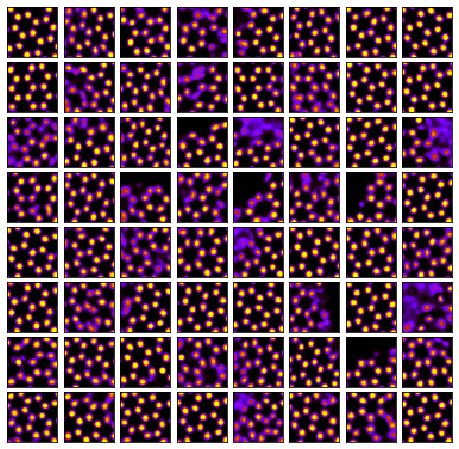

In [ ]:
# Visulaizing the subimages from the entire dataset
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax in axes.flat:
    i = np.random.randint(len(imstack_c))
    ax.imshow(imstack_c[i, ..., 0], cmap='gnuplot', interpolation='nearest')

In [ ]:
# The supervised dataset will initially be 20% of the total dataset
np.random.seed(10)
train_inds = np.random.choice(np.arange(len(imstack_c)), size = int(0.20*len(imstack_c)), replace = False)
train_inds = np.sort(train_inds)
total_inds = np.zeros(len(imstack_c), dtype = bool)
total_inds[train_inds] = True

imstack_train = imstack_c[total_inds]
print(imstack_train.shape)

(14638, 42, 42, 2)


In [ ]:
#@title Function that labels the sub-images based on the number, type of rings detected in a sub image
# It uses the information from the dummy channel to understand the details of the rings present in the dummy-channel

def get_labels(stack):
    """stack corresponds to the images concatanated with ring information"""
    lab = -5*np.ones(len(stack))
    total_rings = []

    # We will start the labeling here
    for i, im in enumerate(stack):
        im_d, im_r = im[:,:,0], im[:,:,1] #correspond to decoded and ring imgs respectively
        im_r_crop = im_r[8:32, 8:32]
        crop_cen = [12, 12]
    # We will ignore the image with 3 or 4 membered rings present
        if np.sum(im_r_crop==3) + np.sum(im_r_crop==4) == 0:

        # We will only consider [5,6,7] membered rings
            num_rings = np.sum(im_r_crop >= 5)

            if num_rings>3:
                #we only consider the closest 3 rings
                ring_cens = np.argwhere(im_r_crop >= 5)
                dists = np.abs(ring_cens[:,0] - crop_cen[0] + 1j*(ring_cens[:,0] - crop_cen[0]))
                sort_dists = np.argsort(dists)
                for k in sort_dists[3::]:
                    im_r_crop[ring_cens[k,0], ring_cens[k,1]] = 0

            num_rings = np.sum(im_r_crop >= 5)
            total_rings.append(num_rings)
            # We will use images that produce at least 500 images
            if num_rings == 1:
                # The zeroth class will correspond to images with one ring
                lab[i] = 0
            elif num_rings == 2:
                if np.sum(im_r_crop == 6) == 2:
                    # Class-1 correspond to two 6,6 rings
                    lab[i] = 1
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 1:
                    # Class-2 correspond to two 5,6 rings
                    lab[i] = 2
            elif num_rings == 3:
                if np.sum(im_r_crop==6) == 2 and np.sum(im_r_crop==7) == 1:
                    # Class-3 correspond to 6,6,7 rings
                    lab[i] = 3
                if np.sum(im_r_crop==6) == 3:
                    # Class-4 correspond to 6,6,6 rings
                    lab[i] = 4
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 1 and np.sum(im_r_crop==7) == 1:
                    # Class-5 correspond to 5,6,7 rings
                    lab[i] = 5
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 2:
                    # Class-6 correspond to 5,6,6 rings
                    lab[i] = 6

            # else:
            #     rings_ = [np.sum(im_r_crop == 5), np.sum(im_r_crop == 6), np.sum(im_r_crop == 7)]
            #     two_rings.append(rings_)
    return lab

In [ ]:
# We only get the labels of the training dataset
lab_train = get_labels(imstack_train)

# The training dataset is further filtered by deleting images that do not fall into the 7 classes we picked earlier
train_inds_mod = train_inds[lab_train!=-5]
train_inds_mod = np.sort(train_inds_mod)

total_inds = np.zeros(len(imstack_c), dtype = bool)
total_inds[train_inds_mod] = True

imstack_train_mod = imstack_c[total_inds]
print(imstack_train_mod.shape)

lab_train_mod = get_labels(imstack_train_mod)
print(np.sum(lab_train_mod == -5))

(13261, 42, 42, 2)


So we have 13261 images divided into 7 classes as the unsupervised dataset, we will further divide this into training and validation classes. For now, we will visualize 64 randomly picked images from each class

# Visualizing the labeled images in each class

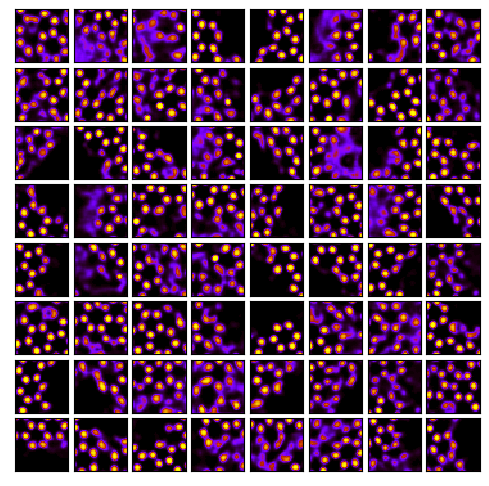

In [ ]:
# Class-0 : Fewer than 2 rings
# Visulaizing the subimages
zeroth_class = imstack_train_mod[lab_train_mod == 0]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(zeroth_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(zeroth_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

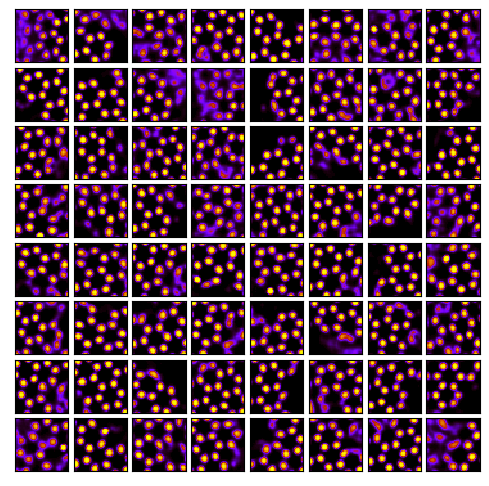

In [ ]:
# Class-1 : 2 rings : 6,6
# Visulaizing the subimages
first_class = imstack_train_mod[lab_train_mod == 1]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(first_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(first_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

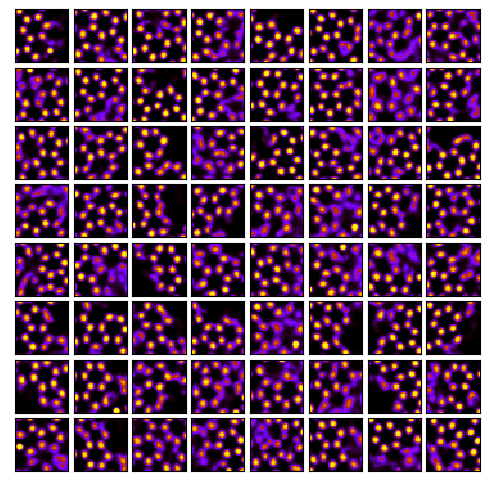

In [ ]:
# Class-2 : 2 rings : 5,6
second_class = imstack_train_mod[lab_train_mod == 2]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(second_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(second_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

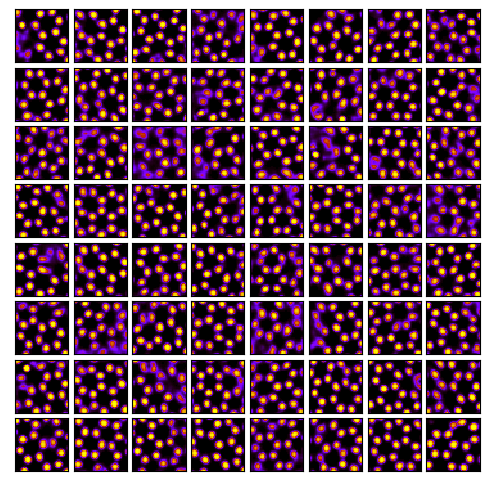

In [ ]:
# Class-3 : 3 rings : 6,6,7
third_class = imstack_train_mod[lab_train_mod == 3]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(third_class))
    ax.imshow(third_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

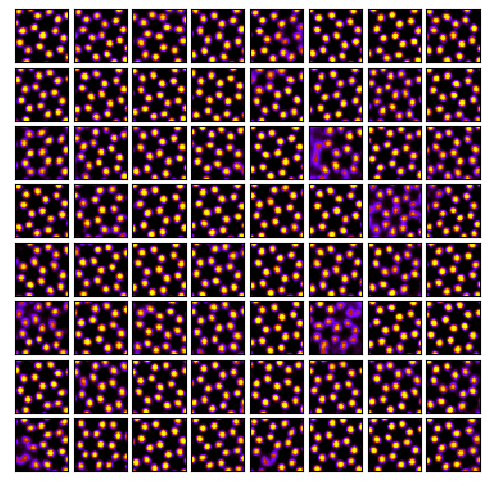

In [ ]:
# Class-4 : 3 rings : 6,6,6
fourth_class = imstack_train_mod[lab_train_mod == 4]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(fourth_class))
    ax.imshow(fourth_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

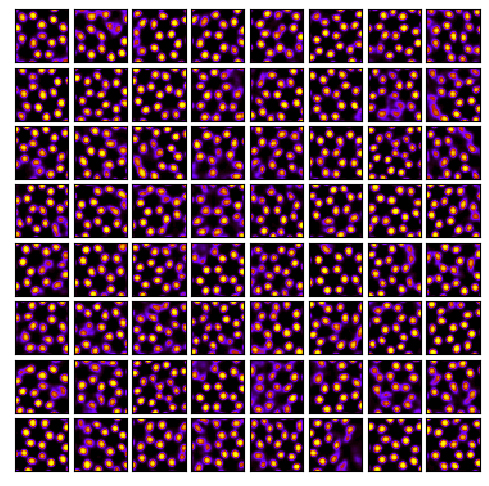

In [ ]:
# Class-5 : 3 rings : 5,6,7
fifth_class = imstack_train_mod[lab_train_mod == 5]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(fifth_class))
    ax.imshow(fifth_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

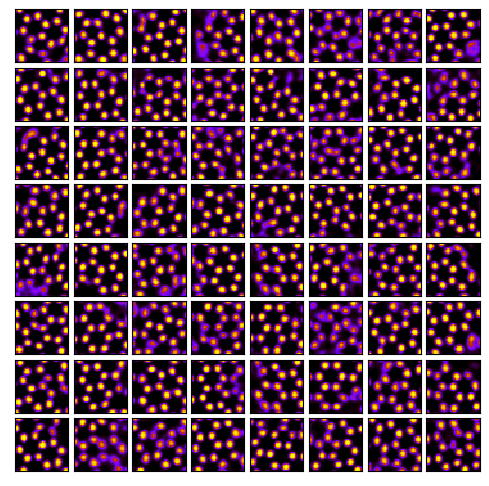

In [ ]:
# Class-6 : 3 rings : 5,6,6
sixth_class = imstack_train_mod[lab_train_mod == 6]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(sixth_class))
    ax.imshow(sixth_class[i, ..., 0], cmap='gnuplot', interpolation='nearest')

# Here we will train the ssrVAE

In [ ]:
# First splitting the train_inds_mod into training and validation datasets

np.random.seed(0)
total_inds = 2*np.ones(len(imstack_c))
total_inds[train_inds_mod] = 1  # Sup_inds
# total_inds = np.zeros(len(imstack_c))

# 20% of the supervised set will be set aside for validation
val_inds = np.sort(np.random.choice(train_inds_mod, size = int(0.2*len(train_inds_mod)), replace = False))
total_inds[val_inds] = 0   # val_inds


print(np.sum(total_inds == 0))  #val_inds
print(np.sum(total_inds == 1))  #sup_inds
print(np.sum(total_inds == 2))  ##unsup_inds

print(10609/(2652+10609+59931))

2652
10609
59931
0.14494753524975407


Only 14.5% of the dataset is used as supervised training the ssrVAE

In [ ]:
# Preparing supervised, validation, and unsupervised datasets
imstack_val = imstack_c[total_inds == 0]
imstack_sup = imstack_c[total_inds == 1]
imstack_unsup = imstack_c[total_inds == 2]

#Getting the labels
lab_val = pv.utils.to_onehot(tt(get_labels(imstack_val)).to(torch.int64), 7)
lab_sup = pv.utils.to_onehot(tt(get_labels(imstack_sup)).to(torch.int64), 7)
# lab_unsup = get_labels(imstack_sup)

# Adding channel dimension
imstack_val = tt(imstack_val[..., 0])[:, None]
imstack_sup = tt(imstack_sup[..., 0])[:, None]
imstack_unsup = tt(imstack_unsup[..., 0])[:, None]

print(imstack_val.size())
print(imstack_sup.size())
print(imstack_unsup.size())

torch.Size([2652, 1, 42, 42])
torch.Size([10609, 1, 42, 42])
torch.Size([59931, 1, 42, 42])


In [ ]:
# Initiating the loaders
(loader_unsup, loader_sup,
 loader_val) = pv.utils.init_ssvae_dataloaders(
     imstack_unsup, (imstack_sup, lab_sup), (imstack_val, lab_val), batch_size=50)

r = len(loader_sup) / (len(loader_unsup) + len(loader_sup))
print("Ratio of labeled data: {}".format(r))

Ratio of labeled data: 0.1508498583569405


In [ ]:
# Training the ss-rVAE, The trained weights will be loaded in the next cell
# So, one can skip this cell to save some time.


data_dim = (42, 42)   # Input dimensions of the dataset i.e., shape of each card's image
latent_dim = 2    # Number of latent dimensions other than the invariancies and class labels
num_classes = 7    # Corresponds to the number of discrete classes in the dataset, these get concatenated to the encoder and decoder automatically

# Initialize probabilistic VAE model ->
# (invariances=None: vanilla VAE
#  invariances=['r']: enforces rotational invariance
#  invariances=['t']: enforces translational invariance
#  invariances=['r', 't']: enforces invariance to rotations & translations
#  etc.)

# Initialize model
ssrvae_graphene = pv.models.ssiVAE(
    data_dim, latent_dim, num_classes,
    hidden_dim_e = [512, 512],   # Number of neurons in each of the hidden layers in the encoder
    hidden_dim_d = [512, 512],   # Number of neurons in each of the hidden layers in the decoder
    invariances=['r', 't'])

# Initialize trainer
trainer_graphene = pv.trainers.auxSVItrainer(ssrvae_graphene)

# The KL-scale corresponds to the weight given to the KL-divergence term in the loss function.
# A higher KL-scale places more emphasis on the KL-divergence term, which encourages the model to learn a more compact latent representation.
# We're going to ramp-up KL weight from 1 to 2 in the first 30 epochs
kl_scale = torch.linspace(1, 2, 30)
# Train model for n epochs
for e in range(100):
    sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1]
    trainer_graphene.step(loader_unsup, loader_sup,
                 aux_loss_multiplier=30, scale_factor=sc, seed = 0)
    trainer_graphene.print_statistics()

# Saving the weights of the trained ssrVAE model
ssrvae_graphene.save_weights('ssrave_graphene_512_80')

Epoch: 1 Training loss: 835.7425
Epoch: 2 Training loss: 828.0227
Epoch: 3 Training loss: 642.6945
Epoch: 4 Training loss: 556.7453
Epoch: 5 Training loss: 546.4049
Epoch: 6 Training loss: 542.1877
Epoch: 7 Training loss: 538.4378
Epoch: 8 Training loss: 537.1657
Epoch: 9 Training loss: 535.6289
Epoch: 10 Training loss: 534.6425
Epoch: 11 Training loss: 534.5088
Epoch: 12 Training loss: 532.0177
Epoch: 13 Training loss: 531.7373
Epoch: 14 Training loss: 531.6675
Epoch: 15 Training loss: 531.6582
Epoch: 16 Training loss: 530.7855
Epoch: 17 Training loss: 530.7698
Epoch: 18 Training loss: 531.6319
Epoch: 19 Training loss: 531.0373
Epoch: 20 Training loss: 531.9277
Epoch: 21 Training loss: 530.8399
Epoch: 22 Training loss: 531.3863
Epoch: 23 Training loss: 530.6415
Epoch: 24 Training loss: 530.5229
Epoch: 25 Training loss: 531.0681
Epoch: 26 Training loss: 530.9385
Epoch: 27 Training loss: 531.2341
Epoch: 28 Training loss: 530.9932
Epoch: 29 Training loss: 531.0785
Epoch: 30 Training loss

# Visualizing the results

In [ ]:
# Initialize a new model
data_dim = (42, 42)
latent_dim = 2
num_classes = 7
ssrvae_graphene = pv.models.ssiVAE(
    data_dim, latent_dim, num_classes,
    hidden_dim_e = [512, 512],
    hidden_dim_d = [512, 512],
    invariances=['r', 't'])

# Downloading the weights
!gdown 1yR3QHZntdG8EPx3CIZW0ORDHKII0v8Yf

# Loading the downloaded weights
ssrvae_graphene.load_weights('ssrvae_graphene_512_80.pt')

Downloading...
From: https://drive.google.com/uc?id=1yR3QHZntdG8EPx3CIZW0ORDHKII0v8Yf
To: /content/ssrvae_graphene_512_80.pt
100% 7.81M/7.81M [00:00<00:00, 209MB/s]


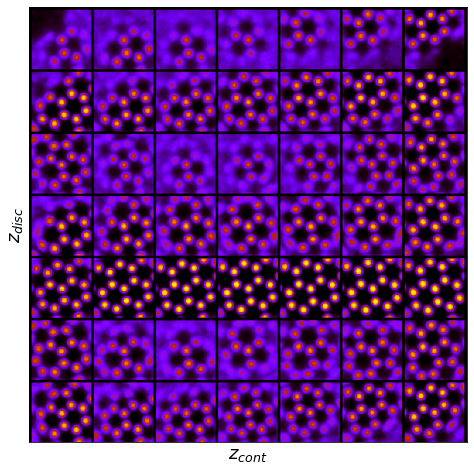

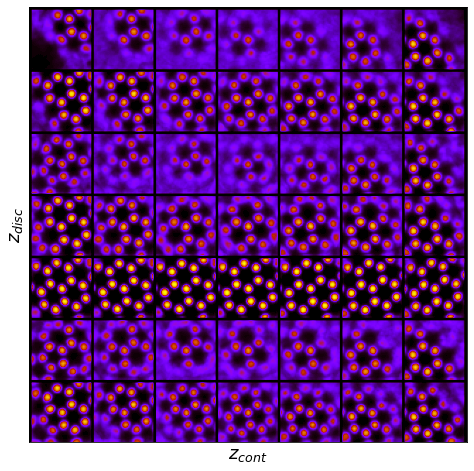

In [ ]:
# Decoded latent space:
# The latent space is uniformly sampled in z1-z2 latent dimensions.
# These points are decoded back into the image space and are plotted in their corresponding latent space positions
# Since the latent space of crVAE is conditioned on the class label, we get one latent space for each class

# Traverse manifold is the decoded latent space in which one of the continouous latent dimension is held at constant (0),
# While the other continuous dimensions and the discrete dimension are used to plot the decoded latent space.
for i in range(2):
    ssrvae_graphene.manifold_traversal(7, i, cmap='gnuplot')

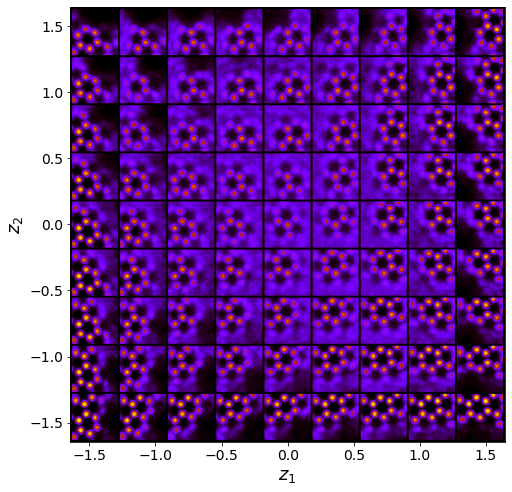

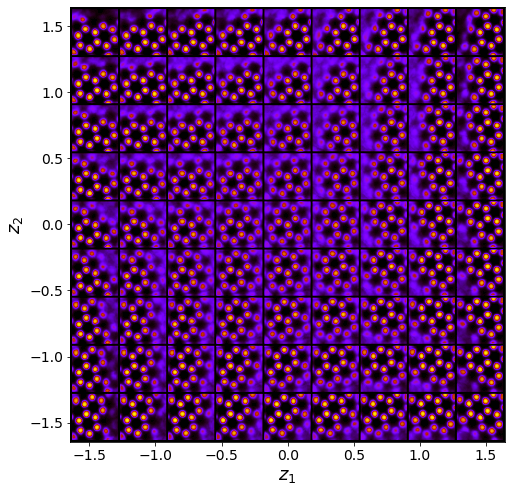

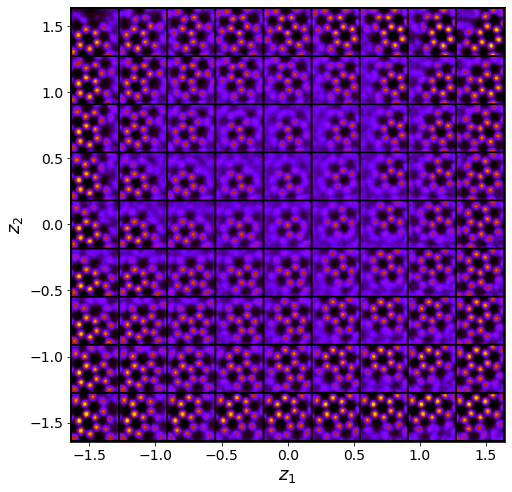

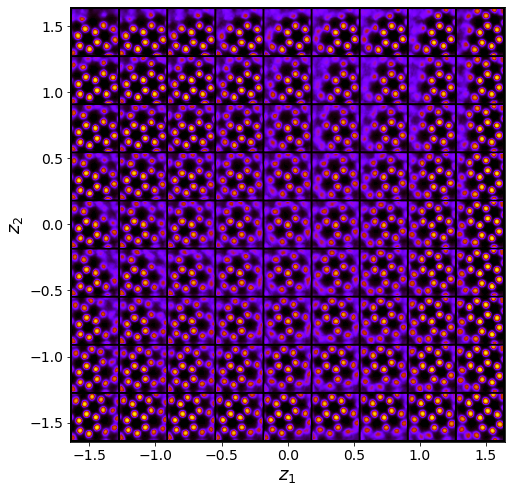

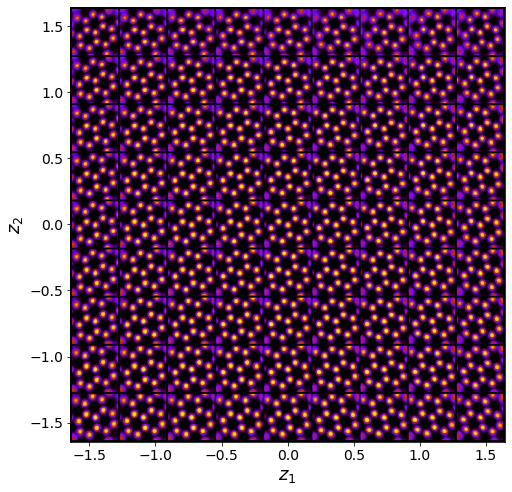

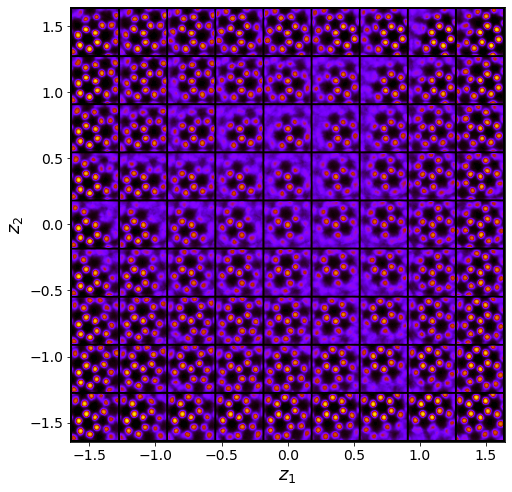

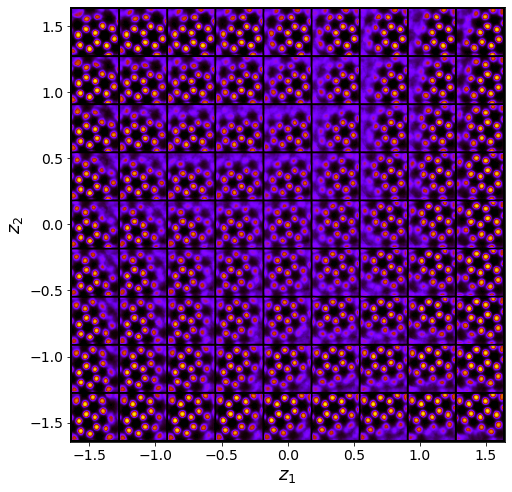

In [ ]:
# Decoded latent space of each class
for cls in range(7):
    ssrvae_graphene.manifold2d(d=9, label = cls)

Latent Distributions:  
Input images are represented as points in the latent space using the encoder  
These points are then colored with various ground-truth properties to visualize their distribution

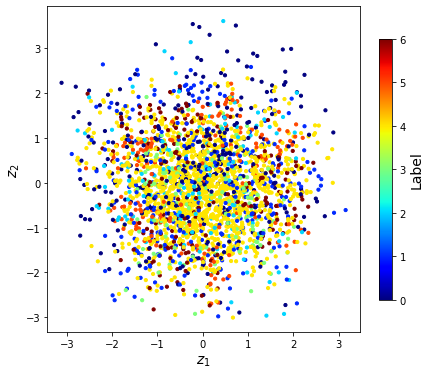

In [ ]:
targets_val = torch.argmax(lab_val, dim = 1)   # Getting the ground truth labels of the validation dataset
z_mean_val, z_sd_val, pred_val = ssrvae_graphene.encode(imstack_val.reshape([-1, 42*42]))   # Encoding the validation dataset
# z_mean_val: mean of the latent space representation of the input dataset,
# z_sd_val: standard deviation of the latent space representation of the input dataset,
# 0th column corresponds to angle and then the regular latent dimensions (First invariant dimensions and then regular latent dimensions)

# latent distribution of the validation dataset colored using ground-truth class labels
fig, ax = plt.subplots(1, 1, figsize =(7, 6))
im = ax.scatter(z_mean_val[:,-1], z_mean_val[:,-2], c=targets_val, s=10, cmap='jet')
ax.set_xlabel("$z_1$", fontsize=14)
ax.set_ylabel("$z_2$", fontsize=14)
cbar = fig.colorbar(im, ax=ax, shrink=.8)
cbar.set_label("Label", fontsize=14)
cbar.ax.tick_params(labelsize=10)
plt.show()

In [ ]:
# As a final step of the analysis, we will visualize the confusion matrix between the predicted and the actual targets

from sklearn.metrics import accuracy_score, confusion_matrix
print(accuracy_score(y_true = targets_val, y_pred = pred_val))

con_mat = confusion_matrix(y_true = targets_val, y_pred = pred_val)

0.7458521870286576


With the imperfect labeling technique used and labeling only 14.5% of the dataset, the network was able to predict the class labels of the validation dataset with 74.6% accuracy

In [ ]:
# Function to visualize the confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize = 12)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize =15)
    plt.yticks(tick_marks, classes, rotation=45, fontsize = 15)
    plt.tight_layout()
    plt.ylabel('True label', fontsize = 15)
    plt.xlabel('Predicted label', fontsize = 15)

Normalized confusion matrix
[[5.38699690e-01 1.14551084e-01 1.45510836e-01 4.02476780e-02
  9.28792570e-03 8.97832817e-02 6.19195046e-02]
 [7.74410774e-02 4.64646465e-01 3.03030303e-02 1.34680135e-01
  1.64983165e-01 3.03030303e-02 9.76430976e-02]
 [1.66666667e-01 8.33333333e-02 4.24242424e-01 7.57575758e-03
  7.57575758e-03 2.12121212e-01 9.84848485e-02]
 [0.00000000e+00 1.47651007e-01 1.34228188e-02 6.51006711e-01
  5.36912752e-02 1.00671141e-01 3.35570470e-02]
 [7.23589001e-04 4.48625181e-02 0.00000000e+00 1.59189580e-02
  9.12445731e-01 1.44717800e-03 2.46020260e-02]
 [5.49450549e-03 3.29670330e-02 1.53846154e-01 4.39560440e-02
  0.00000000e+00 7.19780220e-01 4.39560440e-02]
 [5.34759358e-03 5.34759358e-02 1.60427807e-01 2.67379679e-02
  3.74331551e-02 6.95187166e-02 6.47058824e-01]]


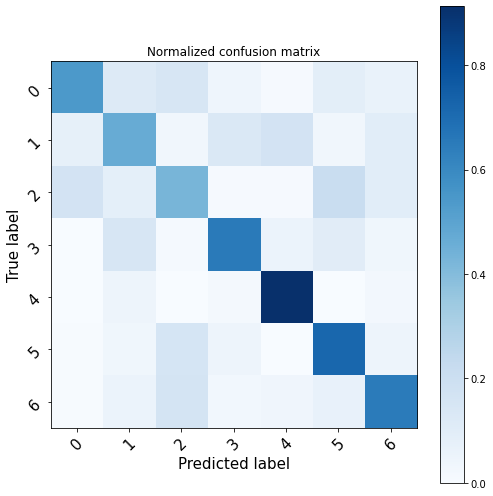

In [ ]:
# Visualizing the normalized confusion matrix
class_names = ['0', '1', '2', '3', '4', '5', '6']

#show confusion matrix plot
plt.figure(figsize = (7,7))
plot_confusion_matrix(con_mat, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.savefig('ssrvae_confusion_matrix.png', dpi = 300)
plt.show()

In [ ]:
#Encoding the entire dataset (feature vectors)
z_mean_all, z_sd_all, pred_all = ssrvae_graphene.encode(tt(imstack_c[...,0].reshape([-1, 42*42])))
z1, z2, z3 = z_mean_all[:,0], z_mean_all[:, 1:3], z_mean_all[:, 3:]

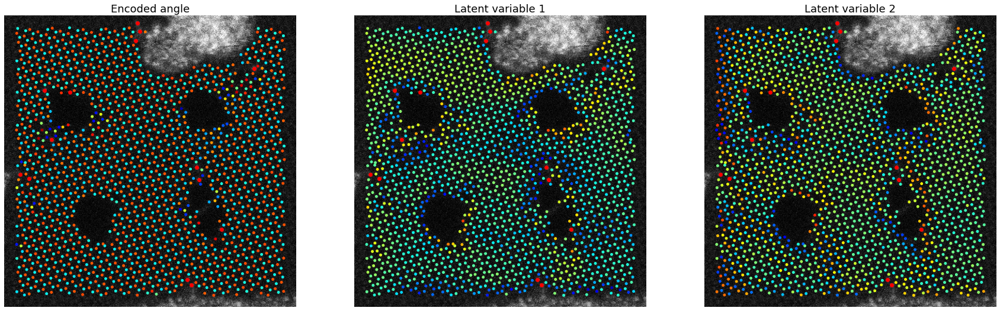

In [ ]:
#Visualizing the latent space encodings on the raw STEM image

frame = 0 # select frame

com_i = com_all[frames_all == frame] # get coordinates for this frame
com_i_Si = lattice_coord[frame] # get Si coordinates for plotting
com_i_Si = com_i_Si[com_i_Si[:,-1]==1.]
z1_i = z1[frames_all == frame] # get latent variables (image) for this frame
z3_i = z3[frames_all == frame] # get latent variables (image) for this frame
pred_i = pred_all[frames_all == frame]  # Getting the labels for the subimages of this frame

col_min0 = z1.min()
col_max0 = z1.max()
col_min1 = z3[:, 0].min()
col_max1 = z3[:, 0].max()
col_min2 = z3[:, 1].min()
col_max2 = z3[:, 1].max()

fig, ax = plt.subplots(1, 3, figsize=(30, 10))
ax[0].imshow(STEM_real[frame,...,0], cmap="gray")
ax[0].scatter(com_i[:, 1], com_i[:, 0], c=z1_i, s=15,
            cmap="jet", vmin=col_min0, vmax=col_max0)
ax[0].set_title("Encoded angle", fontsize=18)
ax[1].imshow(STEM_real[frame,...,0], cmap="gray")
ax[1].scatter(com_i[:, 1], com_i[:, 0], c=z3_i[:, 0], s=15,
            cmap="jet", vmin=col_min1, vmax=col_max1)
ax[1].set_title("Latent variable 1", fontsize=18)
ax[2].imshow(STEM_real[frame,...,0], cmap="gray")
ax[2].scatter(com_i[:, 1], com_i[:, 0], c=z3_i[:, 1], s=15,
              cmap="jet", vmin=col_min2, vmax=col_max2)
ax[2].set_title("Latent variable 2", fontsize=18)
for _ax in fig.axes:
    _ax.scatter(com_i_Si[:, 1], com_i_Si[:, 0], s=35, c='Red')
    _ax.axis(False)
plt.show()

(-0.5, 511.5, 511.5, -0.5)

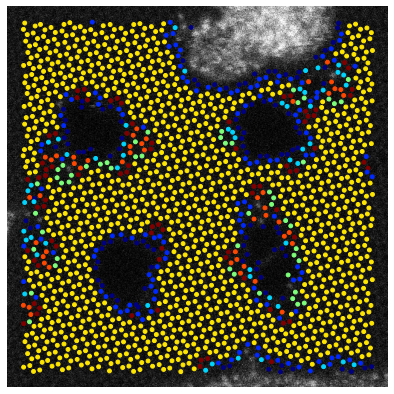

In [ ]:
#Visualizing the predicted class labels on the raw STEM image
fig, ax = plt.subplots(figsize = (7,7))
ax.imshow(STEM_real[frame,...,0], cmap="gray")
ax.scatter(com_i[:, 1], com_i[:, 0], c=pred_i, s=15,
            cmap="jet")
ax.axis('off')
# plt.savefig('ssrvae_graphene_labels.png', dpi = 300)